# Đề tài: Phân loại giống chó

Gồm 23 giống chó phổ biến ở Việt Nam và 1 nhãn khác (người, vật) 

## Google Colab Tasks

Kiểm tra thời gian chạy

In [1]:
!cat /proc/uptime | awk '{print $1 /60 /60 /24 "days (" $1 "sec)"}'

0.0411642days (3556.59sec)


Kiểm tra dung lượng 

In [3]:
!df -h

Filesystem      Size  Used Avail Use% Mounted on
overlay          79G   28G   52G  35% /
tmpfs            64M     0   64M   0% /dev
shm             5.7G     0  5.7G   0% /dev/shm
/dev/root       2.0G  1.1G  849M  57% /usr/sbin/docker-init
tmpfs           6.4G  668K  6.4G   1% /var/colab
/dev/sda1        75G   56G   19G  76% /opt/bin/.nvidia
tmpfs           6.4G     0  6.4G   0% /proc/acpi
tmpfs           6.4G     0  6.4G   0% /proc/scsi
tmpfs           6.4G     0  6.4G   0% /sys/firmware
drive            15G   14G  1.4G  92% /content/drive


In [4]:
!free -h

               total        used        free      shared  buff/cache   available
Mem:            12Gi       1.3Gi        10Gi       1.0Mi       856Mi        11Gi
Swap:             0B          0B          0B


Kết nối gg drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Đọc ảnh màu thành trắng đen và lưu vào file CSV

Học phân loại giống chó với trường hợp các ảnh là ảnh trắng đen

In [ ]:
import os
import numpy as np
import pandas as pd
import cv2

Khai báo thuộc tính dùng cho load hình ảnh

In [ ]:
train_dir='dataset/train3'
test_dir='dataset/val3'
img_height = 224
img_width = 224
batch_size = 16

Load hình ảnh

In [ ]:
def load_images_from_directory(root_dir,image_size=(224,224)):
    images=[]
    labels=[]
    dem=1
    classes=sorted(os.listdir(root_dir))

    for class_index,class_name in enumerate(classes):
        class_dir=root_dir+'/'+class_name

        for filename in os.listdir(class_dir):
            file_path=class_dir+'/'+filename
            print(file_path)
            if 'tải xuống' in file_path:
                duoi=filename.split('.')[1]
                os.rename(file_path,class_dir+'/'+'taixuong'+str(dem)+'.'+duoi)
                file_path=class_dir+'/'+'taixuong'+str(dem)+'.'+duoi
                dem+=1
            image=cv2.imread(file_path,cv2.IMREAD_GRAYSCALE).astype(np.uint8)
            image=cv2.resize(image,image_size)
            # image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
            # image=np.array(image)/255.0
            images.append(image)
            labels.append(class_index)

    return np.array(images),np.array(labels),classes

In [ ]:
X_train,y_train,classes=load_images_from_directory(train_dir)

dataset/train3/beagle/n02088364_10108.jpg
dataset/train3/beagle/n02088364_10296.jpg
dataset/train3/beagle/n02088364_10354.jpg
dataset/train3/beagle/n02088364_10362.jpg
dataset/train3/beagle/n02088364_10575.jpg
dataset/train3/beagle/n02088364_10947.jpg
dataset/train3/beagle/n02088364_11130.jpg
dataset/train3/beagle/n02088364_11136.jpg
dataset/train3/beagle/n02088364_11147.jpg
dataset/train3/beagle/n02088364_11231.jpg
dataset/train3/beagle/n02088364_1128.jpg
dataset/train3/beagle/n02088364_11391.jpg
dataset/train3/beagle/n02088364_11458.jpg
dataset/train3/beagle/n02088364_11509.jpg
dataset/train3/beagle/n02088364_11698.jpg
dataset/train3/beagle/n02088364_11711.jpg
dataset/train3/beagle/n02088364_11828.jpg
dataset/train3/beagle/n02088364_11836.jpg
dataset/train3/beagle/n02088364_12124.jpg
dataset/train3/beagle/n02088364_12131.jpg
dataset/train3/beagle/n02088364_12178.jpg
dataset/train3/beagle/n02088364_12291.jpg
dataset/train3/beagle/n02088364_12303.jpg
dataset/train3/beagle/n02088364_123

In [ ]:
X_test,y_test,_=load_images_from_directory(test_dir)

dataset/val3/beagle/n02088364_10206.jpg
dataset/val3/beagle/n02088364_10585.jpg
dataset/val3/beagle/n02088364_10731.jpg
dataset/val3/beagle/n02088364_10798.jpg
dataset/val3/beagle/n02088364_11930.jpg
dataset/val3/beagle/n02088364_12102.jpg
dataset/val3/beagle/n02088364_12154.jpg
dataset/val3/beagle/n02088364_12213.jpg
dataset/val3/beagle/n02088364_12710.jpg
dataset/val3/beagle/n02088364_12794.jpg
dataset/val3/beagle/n02088364_12816.jpg
dataset/val3/beagle/n02088364_13236.jpg
dataset/val3/beagle/n02088364_13484.jpg
dataset/val3/beagle/n02088364_13572.jpg
dataset/val3/beagle/n02088364_13627.jpg
dataset/val3/beagle/n02088364_13682.jpg
dataset/val3/beagle/n02088364_13944.jpg
dataset/val3/beagle/n02088364_14431.jpg
dataset/val3/beagle/n02088364_14548.jpg
dataset/val3/beagle/n02088364_15305.jpg
dataset/val3/beagle/n02088364_15315.jpg
dataset/val3/beagle/n02088364_16704.jpg
dataset/val3/beagle/n02088364_16721.jpg
dataset/val3/beagle/n02088364_17258.jpg
dataset/val3/beagle/n02088364_2000.jpg
d

Trộn tập train và test

In [ ]:
shuffle_indices = np.random.permutation(X_train.shape[0])
X_train = X_train[shuffle_indices]
y_train = y_train[shuffle_indices]

In [ ]:
shuffle_indices = np.random.permutation(X_test.shape[0])
X_test = X_test[shuffle_indices]
y_test = y_test[shuffle_indices]

Chuyển vào DataFrame

In [ ]:
df=pd.DataFrame(X_train.reshape(X_train.shape[0],-1))
df['label']=y_train
df.head(10)

,0,1,2,3,4,5,6,7,8,9,...,50167,50168,50169,50170,50171,50172,50173,50174,50175,label
0,1,3,0,5,24,52,61,54,65,67,...,50,67,89,86,96,90,103,85,100,21
1,5,4,14,21,26,37,51,29,27,26,...,180,174,172,169,164,171,162,156,157,9
2,2,6,7,13,21,14,4,6,9,8,...,57,68,67,69,56,56,57,59,69,22
3,133,143,127,146,132,139,151,144,131,120,...,163,75,67,49,41,78,67,57,18,4
4,255,255,255,255,253,251,247,172,173,163,...,86,75,16,7,4,43,99,75,89,2
5,128,128,132,131,132,135,134,132,133,136,...,61,63,62,45,55,48,44,48,50,0
6,14,24,41,43,39,38,39,45,50,64,...,55,57,52,43,37,27,17,11,6,15
7,15,16,16,17,17,18,19,18,18,19,...,98,94,93,94,90,89,86,84,83,15
8,158,165,159,161,151,156,151,160,157,159,...,24,25,24,25,27,24,32,24,24,17
9,69,68,68,68,68,67,67,63,67,64,...,132,93,95,153,165,175,171,159,154,7


Lưu file csv

In [ ]:
df.to_csv('train.csv')

In [ ]:
df=pd.DataFrame(X_test.reshape(X_test.shape[0],-1))
df['label']=y_test
df.head(10)

,0,1,2,3,4,5,6,7,8,9,...,50167,50168,50169,50170,50171,50172,50173,50174,50175,label
0,72,77,76,75,73,71,69,65,62,66,...,38,40,41,46,80,161,203,216,202,21
1,26,26,26,26,26,26,26,25,25,25,...,10,13,13,11,10,7,3,4,4,7
2,108,147,145,146,145,145,146,146,146,146,...,191,191,191,191,191,191,187,191,131,13
3,15,26,43,47,35,36,33,46,67,91,...,123,131,131,116,102,112,118,119,153,7
4,85,100,106,100,101,114,124,117,128,100,...,240,241,236,236,236,235,234,234,234,20
5,234,234,241,244,233,207,213,218,240,241,...,152,178,167,167,187,155,135,159,182,4
6,51,55,57,61,73,58,48,52,52,55,...,254,254,254,254,254,254,254,254,254,2
7,92,92,86,85,83,77,88,91,90,105,...,129,134,135,131,128,129,131,125,124,6
8,39,39,40,42,43,44,42,42,39,39,...,71,71,71,70,71,70,69,66,66,10
9,100,125,140,134,120,95,67,70,114,134,...,137,110,120,108,111,127,108,101,114,16


Lưu file csv

In [ ]:
df.to_csv('test.csv')

## Tiền xử lý

Khai báo các thư viện cần thiết

In [1]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
import cv2
from keras.preprocessing.image import ImageDataGenerator
# import time
# import itertools

Khai báo thuộc tính dùng cho load hình ảnh

In [2]:
# train_dir='/content/drive/MyDrive/dataset/train3'
# test_dir='/content/drive/MyDrive/dataset/val3'
img_height = 224
img_width = 224
batch_size = 16

Các nhãn giống chó

In [3]:
classes=['beagle',
 'chihuahua',
 'chow',
 'cocker_spaniel',
 'french_bulldog',
 'german_shepherd',
 'giant_schnauzer',
 'golden_retriever',
 'great_dane',
 'labrador_retriever',
 'malamute',
 'miniature_poodle',
 'miniature_schnauzer',
 'other',
 'pembroke',
 'pomeranian',
 'pug',
 'rottweiler',
 'samoyed',
 'shih-tzu',
 'siberian_husky',
 'standard_poodle',
 'standard_schnauzer',
 'toy_poodle']

Load data train và test

In [5]:
train=pd.read_csv('train.csv')
train.head(1)

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,50167,50168,50169,50170,50171,50172,50173,50174,50175,label
0,0,1,3,0,5,24,52,61,54,65,...,50,67,89,86,96,90,103,85,100,21


In [6]:
X_train=train.drop(columns=['Unnamed: 0','label'],axis=1)
y_train=train['label']

In [7]:
X_train=np.reshape(np.array(X_train),(X_train.shape[0],224,224))

In [8]:
del(train) #Xóa tránh lãng phí dung lượng

In [10]:
test=pd.read_csv('test.csv')
test.head(1)

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,50167,50168,50169,50170,50171,50172,50173,50174,50175,label
0,0,72,77,76,75,73,71,69,65,62,...,38,40,41,46,80,161,203,216,202,21


In [11]:
X_test=test.drop(columns=['Unnamed: 0','label'],axis=1)
y_test=test['label']

In [12]:
X_test=np.reshape(np.array(X_test),(X_test.shape[0],224,224))

Chuyển sang kiểu numpy array và uint8

In [13]:
y_train=np.array(y_train)
y_test=np.array(y_test)
X_train=np.uint8(X_train)
X_test=np.uint8(X_test)

Kiểm tra kích thước của các tập xem đã phù hợp hay chưa

In [14]:
X_train.shape,y_train.shape,X_test.shape,y_test.shape

((1920, 224, 224), (1920,), (835, 224, 224), (835,))

In [15]:
del(test)#xóa tránh lãng phí dung lượng

Hiển thị mẫu train

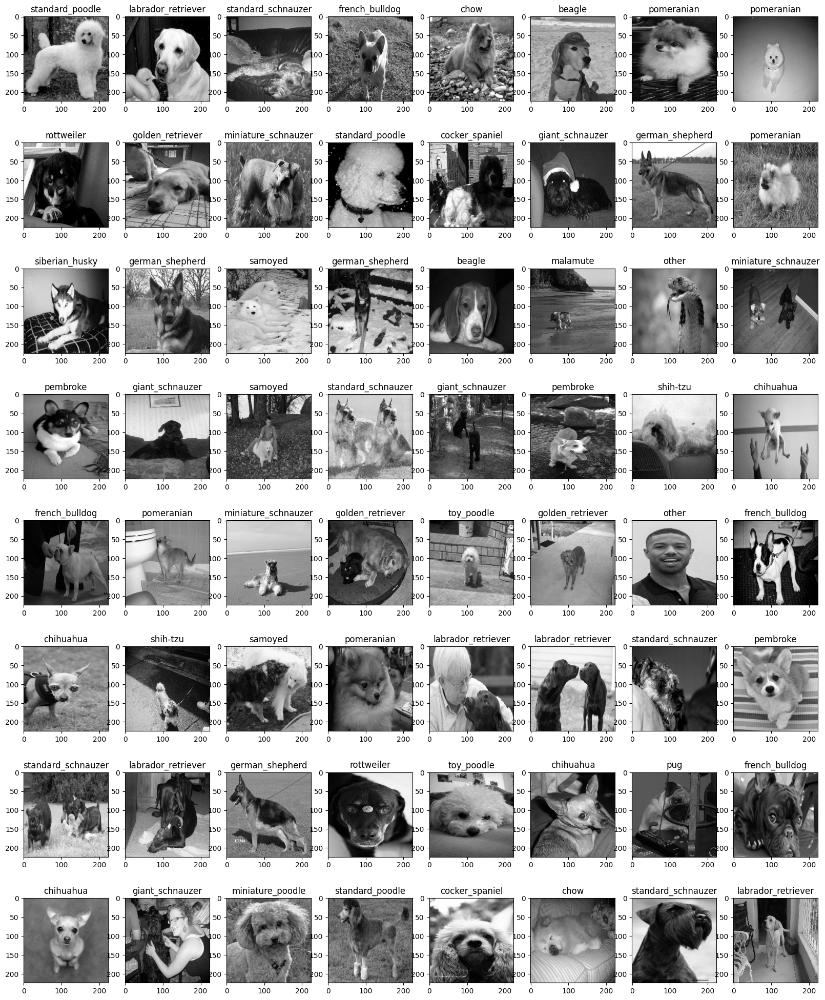

In [16]:
plt.figure(figsize=(20, 25))

for i in range(8*8):
    plt.subplot(8, 8, i+1)
    # if (i==1):
    #     print(image_batch[i])
    plt.imshow(X_train[i],cmap='gray')
    label = classes[y_train[i]]
    plt.title(label)
    i+=1

plt.show()

Cân bằng độ tương phản

Nhằm làm nổi bật một số đặc trưng của ảnh

In [17]:
clahe_16=cv2.createCLAHE(clipLimit=2.0,tileGridSize=(16,16))

In [18]:
for i in range(X_train.shape[0]):
    X_train[i]=clahe_16.apply(X_train[i,:,:])

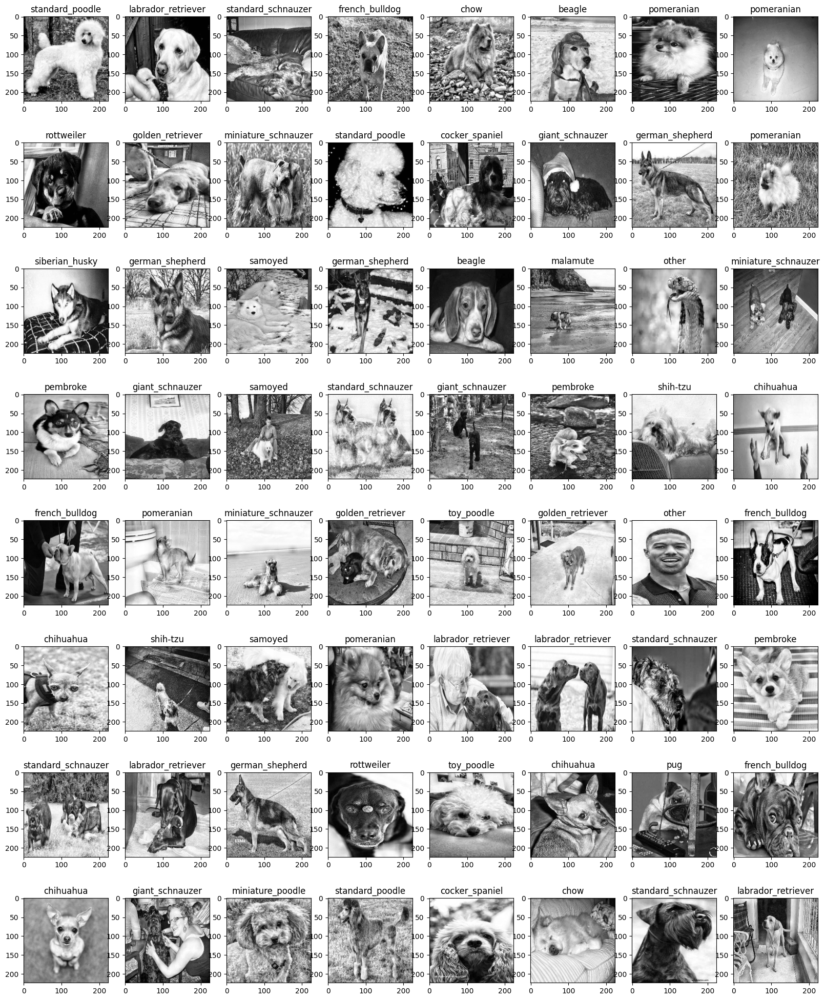

In [19]:
plt.figure(figsize=(20, 25))

for i in range(8*8):
    plt.subplot(8, 8, i+1)
    # if (i==1):
    #     print(image_batch[i])
    plt.imshow(X_train[i],cmap='gray')
    label = classes[y_train[i]]
    plt.title(label)
    i+=1

plt.show()

Lọc nhiễu

Có tác dụng làm mịn ảnh, tránh một số ảnh bị nhiễu hạt tiêu, làm mờ các cạnh, đường nét

In [20]:
for i in range(X_train.shape[0]):
    X_train[i]=cv2.medianBlur(X_train[i,:,:],3)

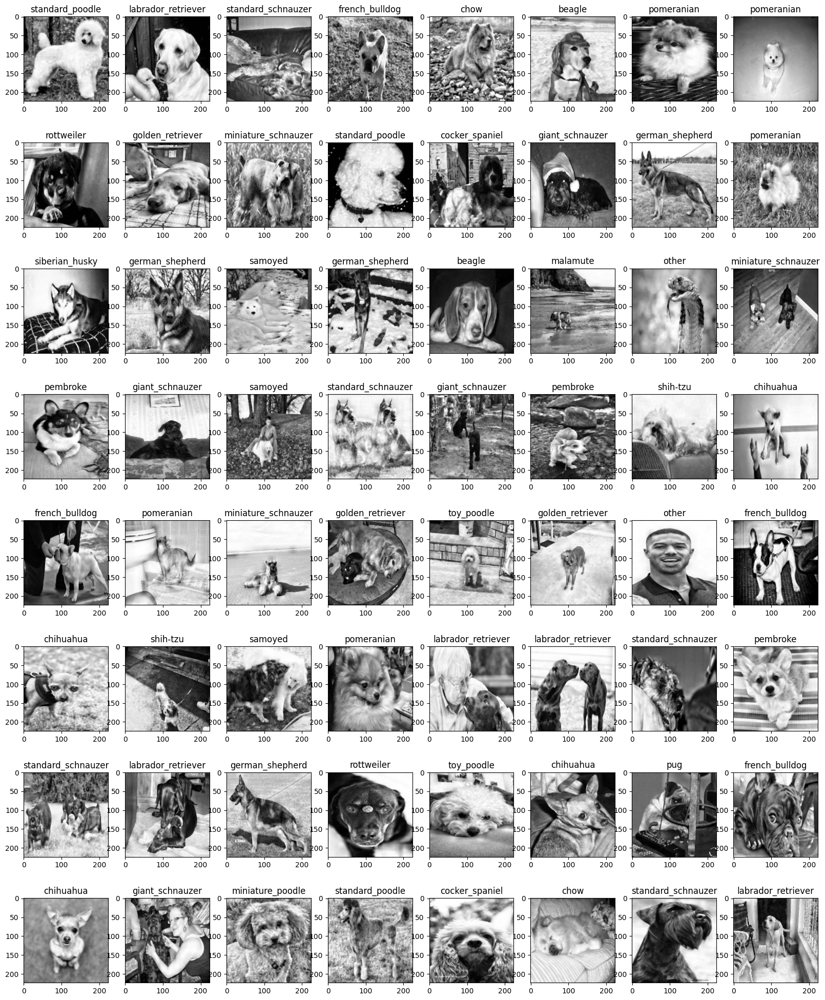

In [21]:
plt.figure(figsize=(20, 25))

for i in range(8*8):
    plt.subplot(8, 8, i+1)
    # if (i==1):
    #     print(image_batch[i])
    plt.imshow(X_train[i],cmap='gray')
    label = classes[y_train[i]]
    plt.title(label)
    i+=1

plt.show()

Lưu trữ lại tập tạm thời, nhằm khôi phục khi có lỗi

In [ ]:
temp_train=np.copy(X_train)
temp_test=np.copy(X_test)
temp_ytrain=np.copy(y_train)
temp_ytest=np.copy(y_test)

Xóa khi không dùng tới nữa

In [ ]:
del(temp_train)
del(temp_test)
del(temp_ytrain)
del(temp_ytest)

Khôi phục tập ban đầu

In [ ]:
X_train=temp_train
X_test=temp_test
y_train=temp_ytrain
y_test=temp_ytest

In [22]:
X_train.shape, X_test.shape, y_train.shape, X_test.shape

((1920, 224, 224), (835, 224, 224), (1920,), (835, 224, 224))

Phân chia val và train

Phép chia phổ biến: train 80% ban đầu, val 20% ban đầu của tập train

In [23]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2)

In [25]:
X_train.shape, y_train.shape, X_val.shape,  y_val.shape

((1536, 224, 224), (1536,), (384, 224, 224), (384,))

Chuẩn hóa

Chia tập hình ảnh cho 255 và reshape lại thành (Số record, cao, rộng, số kênh là 1 với ảnh xám)

In [26]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
class Preprocessor(BaseEstimator, TransformerMixin):
    def __init__(self) -> None:
        super().__init__()
    def fit(self, X, y=None):
        return self
    def transform(self, X, y=None):
        X_process = X/255
        return X_process.reshape(X.shape[0],img_height, img_width, 1)
processor = Pipeline([
    ('Process', Preprocessor())
])

In [ ]:
# Tương tự như
# X_train=X_train/255.0
# X_test=X_test/255.0
# X_val=X_val/255.0
# X_train=X_train.reshape(X_train.shape[0],X_train.shape[1],X_train.shape[2],1)
# X_test=X_test.reshape(X_test.shape[0],X_test.shape[1],X_test.shape[2],1)
# X_val=X_val.reshape(X_val.shape[0],X_val.shape[1],X_val.shape[2],1)

In [27]:
X_train=processor.transform(X_train)
X_val=processor.transform(X_val)
X_test=processor.transform(X_test)

In [34]:
X_train.dtype, X_test.dtype, X_val.dtype

(dtype('float64'), dtype('float64'), dtype('float64'))

In [33]:
X_train.shape,X_test.shape,X_val.shape

((1536, 224, 224, 1), (835, 224, 224, 1), (384, 224, 224, 1))

Tạo ImageDataGenerator để sinh thêm ảnh

Phương pháp Data Augmentation 

Cho phép sinh ảnh ngẫu nhiên có nghiêng, zoom to hơn, lật ngang, lật dọc, ... trên ảnh cũ

In [35]:
datagen = ImageDataGenerator(
        validation_split=0.2,
        rotation_range = 20,  # randomly rotate images in the range (degrees, 0 to 180)
        zoom_range = 0.1, # Randomly zoom image
        shear_range = 0.3,# shear angle in counter-clockwise direction in degrees
        width_shift_range=0.08,  # randomly shift images horizontally (fraction of total width)
        height_shift_range=0.08,  # randomly shift images vertically (fraction of total height)
        vertical_flip=True,
        horizontal_flip=True,fill_mode='nearest')  # randomly flip images

In [38]:
datagen.fit(X_train)

In [39]:
X_X=datagen.flow(X_train, y_train, batch_size=batch_size).next()

16


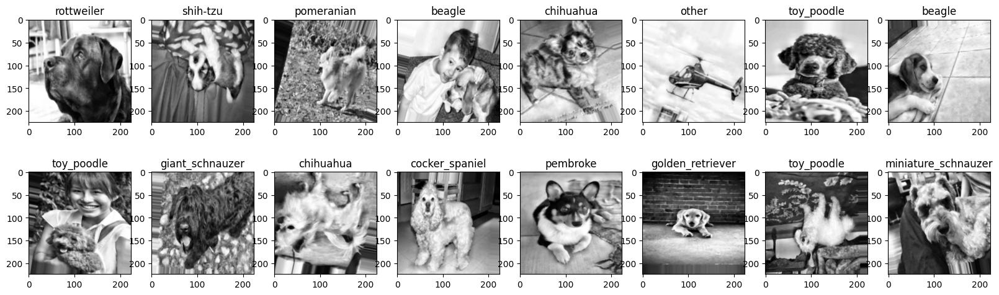

In [40]:
plt.figure(figsize=(20, 25))
print(len(X_X[0]))
for i in range(len(X_X[0])):
    plt.subplot(8, 8, i+1)
    # if (i==1):
    #     print(image_batch[i])
    plt.imshow(X_X[0][i],cmap='gray')
    label = classes[int(X_X[1][i])]
    plt.title(label)
    i+=1

plt.show()

In [41]:
X_X[0].shape

(16, 224, 224, 1)

Vì ảnh xám sẽ có kênh cuối là 1, để sử dụng transfer learning (những mô hình thường chấp nhận đầu vào kênh 3) nên cần phải chuyển đổi trước sang kênh 3 cho tập dữ liệu

In [42]:
def expand_gray_scale(X):
    X_3_channel = X.repeat(3, axis=-1) #expand to 3 dimension
    return X_3_channel

In [43]:
X_train_process=expand_gray_scale(X_train)
X_test_process=expand_gray_scale(X_test)
X_val_process=expand_gray_scale(X_val)

In [44]:
X_train_process.shape, X_test_process.shape, X_val_process.shape

((1536, 224, 224, 3), (835, 224, 224, 3), (384, 224, 224, 3))

Xóa khi không cần dùng kênh 1 nữa

In [ ]:
del(X_train)
del(X_test)
del(X_val)

Kết thúc phần xử lý dữ liệu

## Huấn luyện mô hình

Tổng kết kết quả huấn luyện thì mô hình Xception và ResNet 50 version 2 cho kết quả khả quan cho bài toán phân loại giống chó

### CNN 

Khởi tạo hàm tạo mô hình CNN thuần

In [ ]:
def create_model_cnn2(input_shape):
    model = keras.models.Sequential([
        keras.layers.Conv2D(filters=32, kernel_size=(3,3), padding='same', activation='relu', input_shape=input_shape),
        keras.layers.BatchNormalization(),
        keras.layers.MaxPool2D(pool_size=(2,2),padding='valid'),
        keras.layers.Dropout(0.2),

        keras.layers.Conv2D(filters=64, kernel_size=(3,3), padding='same', activation='relu'),
        keras.layers.MaxPool2D(pool_size=(2,2), padding='valid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dropout(0.2),

        keras.layers.Conv2D(filters=128, kernel_size=(3,3), padding='same', activation='relu'),
        keras.layers.MaxPool2D(pool_size=(2,2), padding='valid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dropout(0.2),

        keras.layers.Flatten(),
        keras.layers.Dense(128, activation='relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(24, activation='softmax')
    ])

    return model


In [ ]:
model = create_model_cnn2((img_height, img_width, 1))
model.compile(loss='sparse_categorical_crossentropy',
                optimizer=keras.optimizers.Adam(learning_rate=0.01),
                metrics=['accuracy'])
model.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_22 (Conv2D)          (None, 224, 224, 32)      320       
                                                                 
 batch_normalization_16 (Ba  (None, 224, 224, 32)      128       
 tchNormalization)                                               
                                                                 
 max_pooling2d_22 (MaxPooli  (None, 112, 112, 32)      0         
 ng2D)                                                           
                                                                 
 dropout_31 (Dropout)        (None, 112, 112, 32)      0         
                                                                 
 conv2d_23 (Conv2D)          (None, 112, 112, 64)      18496     
                                                                 
 max_pooling2d_23 (MaxPooli  (None, 56, 56, 64)       

In [ ]:
folder=r'/content/drive/MyDrive/15_12/'#đường dẫn
checkpoint=tf.keras.callbacks.ModelCheckpoint(
    filepath=folder+'ep{epoch:02d}_dogrdmodel_cnn_acc_{accuracy:.2f}_val_acc_{val_accuracy:.2f}.h5',#cộng thêm tên file cấu trúc
    monitor='val_accuracy',
    save_best_only=True,
    mode='max'
)

In [ ]:
epoch=25
earlystopping = keras.callbacks.EarlyStopping(monitor ="val_loss",
                                        mode ="auto", patience = 5,
                                        restore_best_weights = True)
lr_decay=keras.callbacks.LearningRateScheduler(lambda x: 1e-3 * 0.96 ** (x+epoch))
history=model.fit(datagen.flow(X_train, y_train, batch_size=batch_size),
            epochs=epoch, steps_per_epoch=X_train.shape[0]//batch_size,
            validation_data=(X_val,y_val),verbose=1,
            callbacks=[lr_decay,earlystopping,checkpoint])



Epoch 1/25
96/96 [==============================] - ETA: 0s - loss: 3.6759 - accuracy: 0.0677

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


96/96 [==============================] - 14s 117ms/step - loss: 3.6759 - accuracy: 0.0677 - val_loss: 4.1136 - val_accuracy: 0.0339 - lr: 3.6040e-04
Epoch 2/25
96/96 [==============================] - 11s 109ms/step - loss: 3.3754 - accuracy: 0.0749 - val_loss: 4.0988 - val_accuracy: 0.0286 - lr: 3.4598e-04
Epoch 3/25
96/96 [==============================] - 9s 95ms/step - loss: 3.3106 - accuracy: 0.0911 - val_loss: 4.0341 - val_accuracy: 0.0286 - lr: 3.3214e-04
Epoch 4/25
96/96 [==============================] - 9s 94ms/step - loss: 3.2156 - accuracy: 0.1022 - val_loss: 4.0093 - val_accuracy: 0.0599 - lr: 3.1886e-04
Epoch 5/25
96/96 [==============================] - 11s 113ms/step - loss: 3.1581 - accuracy: 0.1133 - val_loss: 3.8455 - val_accuracy: 0.0547 - lr: 3.0610e-04
Epoch 6/25
96/96 [==============================] - 10s 99ms/step - loss: 3.1030 - accuracy: 0.1270 - val_loss: 3.4250 - val_accuracy: 0.0755 - lr: 2.9386e-04
Epoch 7/25
96/96 [==============================] - 12s 

Đánh giá

<Axes: >

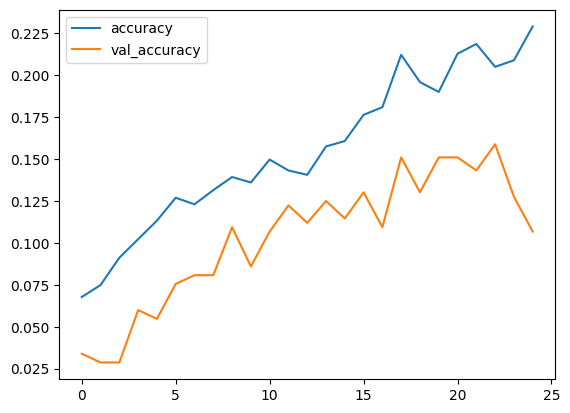

In [ ]:
model_history = pd.DataFrame(history.history)
model_history.loc[:,['accuracy','val_accuracy']].plot()

+ Nhận xét: Loss của tập train và val có giảm dần theo thời gian, mô hình áp dụng nhiều lớp, dropout có hiệu quả. Tuy nhiên tốc độ phát triển chậm => Mô hình không đạt hiệu quả cao trong việc huấn luyện phân loại giống chó.
+ Để tiết kiệm thời gian huấn luyện và tài nguyên, sử dụng phương pháp transfer learning, học với các pre-trained model đã được huấn luyện trước đó với tập dữ liệu lớn như ImageNet. Một số mô hình kể đến như Xception, VGG16, Resnet50, InceptionV3, YOLO,...

### Inception Version 3

In [ ]:
from keras.applications.inception_v3 import InceptionV3

In [ ]:
def create_model_inception(input_shape):
    inception=InceptionV3(include_top=False,weights='imagenet',input_shape=input_shape)
    model = keras.models.Sequential([
        inception,
        keras.layers.GlobalAveragePooling2D(),
        # keras.layers.Dense(1024, activation='relu'),
        # keras.layers.Dropout(0.2),#thêm lớp dropout tránh overfitting
        # keras.layers.Dense(256, activation='relu'),
        keras.layers.Dropout(0.5),#thêm lớp dropout tránh overfitting
        keras.layers.Dense(24, activation='softmax')
    ])
    return inception,model

In [ ]:
base,model = create_model_inception((img_height, img_width, 3))


In [ ]:
base.trainable=False
for layer in model.layers:
  print(layer,layer.trainable)

<keras.src.engine.functional.Functional object at 0x7f852f137940> False
<keras.src.layers.pooling.global_average_pooling2d.GlobalAveragePooling2D object at 0x7f85249de860> True
<keras.src.layers.regularization.dropout.Dropout object at 0x7f852f11cd60> True
<keras.src.layers.core.dense.Dense object at 0x7f852f160190> True


In [ ]:
model.compile(loss='sparse_categorical_crossentropy',
                optimizer=keras.optimizers.Adam(),
                metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dropout (Dropout)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 24)                49176     
                                                                 
Total params: 21851960 (83.36 MB)
Trainable params: 49176 (192.09 KB)
Non-trainable params: 21802784 (83.17 MB)
_________________________________________________________________


In [ ]:
folder='/content/drive/MyDrive/18_12/'
checkpoint=tf.keras.callbacks.ModelCheckpoint(
    filepath=folder+'ep{epoch:02d}_dogrdmodel_inceptionv3_acc_{accuracy:.2f}_val_acc_{val_accuracy:.2f}.h5',#cộng thêm tên file cấu trúc
    monitor='val_accuracy',
    save_best_only=True,
    mode='max'
)

In [ ]:
epoch=15
earlystopping = keras.callbacks.EarlyStopping(monitor ="val_loss",
                                        mode ="auto", patience = 5,
                                        restore_best_weights = True)
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=5, min_lr=0.001)
history=model.fit(X_train_process, y_train,batch_size=batch_size,
            epochs=epoch, verbose=1,
            validation_data=(X_val_process,y_val),
            callbacks=[reduce_lr,earlystopping,checkpoint])

Epoch 1/15
96/96 [==============================] - ETA: 0s - loss: 2.0720 - accuracy: 0.4349

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


96/96 [==============================] - 28s 142ms/step - loss: 2.0720 - accuracy: 0.4349 - val_loss: 0.8508 - val_accuracy: 0.7370 - lr: 0.0010
Epoch 2/15
96/96 [==============================] - 8s 84ms/step - loss: 0.9504 - accuracy: 0.7129 - val_loss: 0.7212 - val_accuracy: 0.7917 - lr: 0.0010
Epoch 3/15
96/96 [==============================] - 7s 74ms/step - loss: 0.7434 - accuracy: 0.7650 - val_loss: 0.6386 - val_accuracy: 0.8047 - lr: 0.0010
Epoch 4/15
96/96 [==============================] - 5s 47ms/step - loss: 0.6042 - accuracy: 0.8021 - val_loss: 0.7108 - val_accuracy: 0.7578 - lr: 0.0010
Epoch 5/15
96/96 [==============================] - 5s 53ms/step - loss: 0.5351 - accuracy: 0.8177 - val_loss: 0.6370 - val_accuracy: 0.8047 - lr: 0.0010
Epoch 6/15
96/96 [==============================] - 5s 50ms/step - loss: 0.4882 - accuracy: 0.8464 - val_loss: 0.7363 - val_accuracy: 0.7865 - lr: 0.0010
Epoch 7/15
96/96 [==============================] - 5s 48ms/step - loss: 0.3782 - acc

<Axes: >

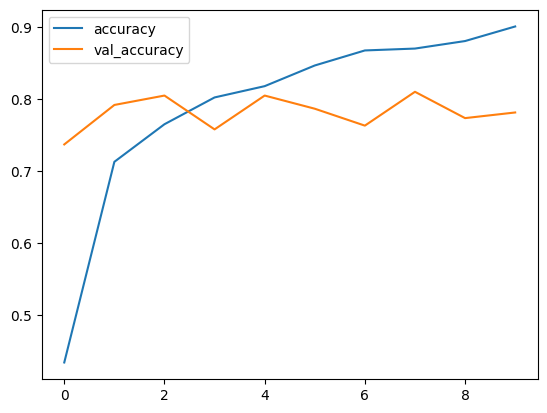

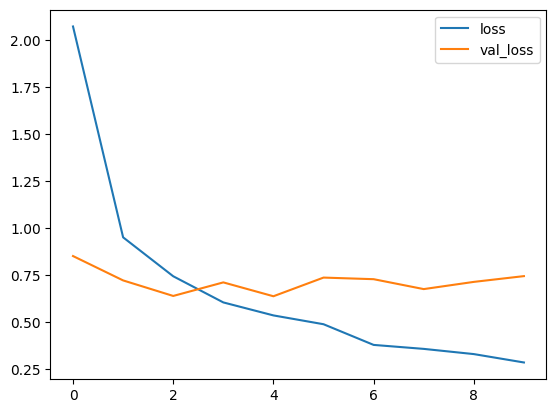

In [ ]:
model_history = pd.DataFrame(history.history)
model_history.loc[:,['accuracy','val_accuracy']].plot()
model_history.loc[:,['loss','val_loss']].plot()

In [ ]:
model=keras.models.load_model('/content/drive/MyDrive/18_12/ep08_dogrdmodel_inceptionv3_acc_0.87_val_acc_0.81.h5')
model.evaluate(X_test_process,y_test)

27/27 [==============================] - 8s 128ms/step - loss: 0.6601 - accuracy: 0.7988


[0.6600974202156067, 0.798802375793457]

In [ ]:
y_predict=np.argmax(model.predict(X_test_process),axis=1)
y_predict

27/27 [==============================] - 4s 75ms/step


array([21,  7, 13,  9, 20,  4,  2,  6, 10, 16, 23,  1,  5, 12, 23, 18, 17,
       23,  4, 13, 18, 17,  3,  0,  8, 14,  0, 10,  0, 12, 16, 18, 20,  7,
        4, 17, 16, 14,  6,  3,  7, 19, 10, 18,  7,  4,  9, 10,  4,  1,  1,
       18, 13,  3,  7, 14,  2, 23, 15, 15,  5, 10,  5,  2, 23, 20, 19, 17,
       14, 15, 22, 17, 17, 12, 13, 14,  9, 10, 17, 16, 16, 21, 19, 22, 12,
       18, 20, 21,  7,  0,  3,  2, 13, 23,  0, 23, 17, 10, 22,  0,  8, 19,
        0,  7,  3, 23,  2,  0, 10,  4,  1,  8,  1, 11, 16, 13, 21, 19, 12,
       12, 17,  4, 18, 19, 16, 13, 20, 18,  0, 16,  8,  4, 21,  1, 17,  6,
        6,  6,  0,  6, 22,  6,  3, 22,  9,  9, 13,  6, 21,  5, 23, 23, 15,
        4,  4, 23,  3, 23, 16, 15, 14,  8, 22,  5, 23,  2, 20, 12,  8, 23,
        2,  5,  4, 23, 13, 20,  5, 12,  3, 14, 10, 12,  7,  0, 10, 20,  9,
       14, 20, 12, 19,  3, 17,  6, 14, 21, 19,  9, 16,  7, 18,  4,  1, 23,
       18,  6, 23, 18,  5,  8, 21, 18,  2,  8,  1, 12, 23,  4, 16, 14, 12,
       12, 19, 15, 23, 13

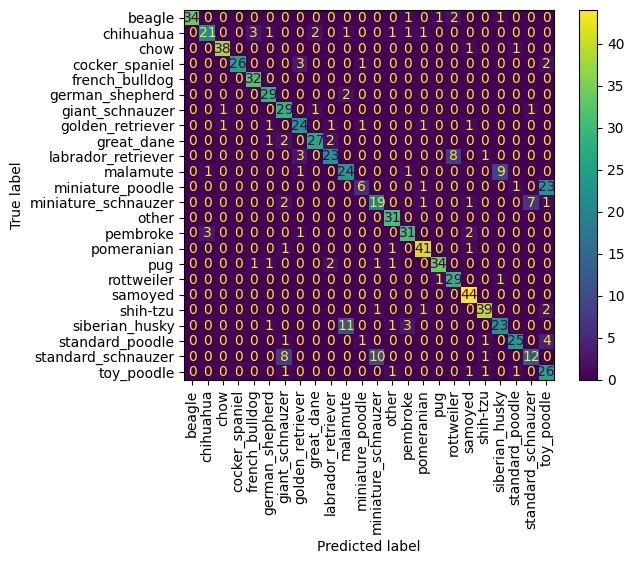

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix

cf_matrix = confusion_matrix(y_test, y_predict)
disp = ConfusionMatrixDisplay(cf_matrix, display_labels=classes)

fig, ax = plt.subplots()

disp.plot(ax=ax)

# Get the x-axis labels
x_labels = ax.get_xticklabels()

# Rotate the x-axis labels by 45 degrees
for label in x_labels:
    label.set_rotation(90)


Nhận xét: Inception cho ra kết quả dự đoán đúng gần 80% trên tập test

### Xception

Sử dụng mô hình Xception được cải tiến từ Inception

In [ ]:
from keras.applications.xception import Xception

In [ ]:
def create_model_xception(input_shape):
    xception=Xception(include_top=False,weights='imagenet',input_shape=input_shape)
    model = keras.models.Sequential([
        xception,
        keras.layers.GlobalAveragePooling2D(),
        # keras.layers.Dense(256, activation='relu'),
        keras.layers.Dropout(0.5),#thêm lớp dropout tránh overfitting
        keras.layers.Dense(24, activation='softmax')
    ])
    return model

In [ ]:
model = create_model_xception((img_height, img_width, 3))
model.compile(loss='sparse_categorical_crossentropy',
                optimizer=keras.optimizers.Adam(learning_rate=0.001),
                metrics=['accuracy'])
model.summary()

83683744/83683744 [==============================] - 4s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, 7, 7, 2048)        20861480  
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dropout (Dropout)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 24)                49176     
                                                                 
Total params: 20910656 (79.77 MB)
Trainable params: 20856128 (79.56 MB)
Non-trainable params: 54528 (213.00 KB)
_________________________________________________________________


In [ ]:
folder=r'/content/drive/MyDrive/15_12/'

In [ ]:
checkpoint=tf.keras.callbacks.ModelCheckpoint(
    filepath=folder+'ep{epoch:02d}_dogrdmodel_xception_acc_{accuracy:.2f}_val_acc_{val_accuracy:.2f}.h5',#cộng thêm tên file cấu trúc
    monitor='val_accuracy',
    save_best_only=True,
    mode='auto'
)

In [ ]:
epoch=25
earlystopping = keras.callbacks.EarlyStopping(monitor ="val_accuracy",
                                        mode ="auto", patience = 5,
                                        restore_best_weights = True)
lr_decay=keras.callbacks.LearningRateScheduler(lambda x: 1e-3 * 0.96 ** (x+epoch))
history=model.fit(datagen.flow(X_train_process, y_train,batch_size=batch_size),
            epochs=epoch,steps_per_epoch=X_train_process.shape[0]//batch_size,verbose=1,
            validation_data=(X_val_process,y_val),
            callbacks=[lr_decay,earlystopping,checkpoint])

Epoch 1/25
96/96 [==============================] - ETA: 0s - loss: 2.3381 - accuracy: 0.3060

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


96/96 [==============================] - 77s 431ms/step - loss: 2.3381 - accuracy: 0.3060 - val_loss: 1.6203 - val_accuracy: 0.4896 - lr: 3.6040e-04
Epoch 2/25
96/96 [==============================] - 31s 316ms/step - loss: 1.4010 - accuracy: 0.5573 - val_loss: 1.4451 - val_accuracy: 0.5495 - lr: 3.4598e-04
Epoch 3/25
96/96 [==============================] - 30s 308ms/step - loss: 1.0384 - accuracy: 0.6719 - val_loss: 1.9315 - val_accuracy: 0.4948 - lr: 3.3214e-04
Epoch 4/25
96/96 [==============================] - 31s 320ms/step - loss: 0.9020 - accuracy: 0.7155 - val_loss: 1.2462 - val_accuracy: 0.6016 - lr: 3.1886e-04
Epoch 5/25
96/96 [==============================] - 28s 289ms/step - loss: 0.6595 - accuracy: 0.7897 - val_loss: 1.3291 - val_accuracy: 0.5938 - lr: 3.0610e-04
Epoch 6/25
96/96 [==============================] - 32s 332ms/step - loss: 0.5290 - accuracy: 0.8242 - val_loss: 1.1178 - val_accuracy: 0.6797 - lr: 2.9386e-04
Epoch 7/25
96/96 [==============================] -

Đánh giá mô hình

<Axes: >

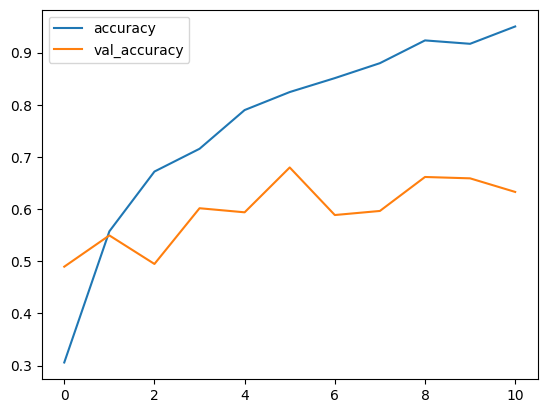

In [ ]:
model_history = pd.DataFrame(history.history)
model_history.loc[:,['accuracy','val_accuracy']].plot()

<Axes: >

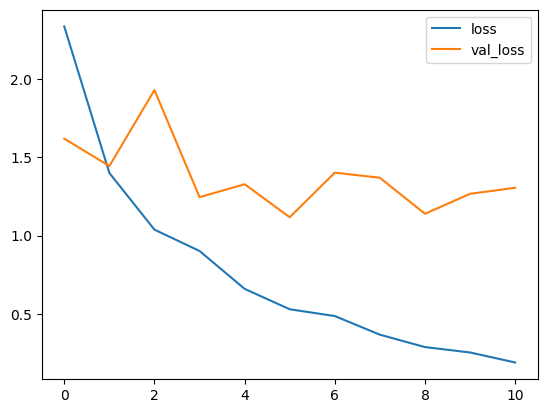

In [ ]:
model_history.loc[:,['loss','val_loss']].plot()

Mô hình có hiện tượng quá khớp (overfitting) và chất lượng hiệu quả chưa đạt mong muốn

Thử lấy mô hình có validation accuracy cao nhất để đánh giá độ hiệu quả với tập test

In [ ]:
model=keras.models.load_model('/content/drive/MyDrive/14_12/ep06_dogrdmodel_xception_acc_0.82_val_acc_0.68.h5')

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, 7, 7, 2048)        20861480  
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dropout (Dropout)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 24)                49176     
                                                                 
Total params: 20910656 (79.77 MB)
Trainable params: 20856128 (79.56 MB)
Non-trainable params: 54528 (213.00 KB)
_________________________________________________________________


In [ ]:
model.evaluate(X_test_process,y_test)

27/27 [==============================] - 10s 162ms/step - loss: 1.4396 - accuracy: 0.6096


[1.4396185874938965, 0.6095808148384094]

Kết quả chỉ đạt 60%

Xét tính nhầm lẫn

In [ ]:
y_predict=np.argmax(model.predict(X_test_process),axis=1)
y_predict

27/27 [==============================] - 4s 134ms/step


array([21,  7, 13, 16, 20,  0,  2, 21, 10, 16, 16,  1, 14,  6,  7, 18, 17,
       23,  4, 13, 15,  9,  3,  9,  9, 15,  0, 10,  4, 12, 16, 15, 20,  7,
        4,  9, 16, 20,  6,  3, 16, 19, 20, 18,  7, 16,  9, 10, 16,  1,  1,
       18, 13,  3,  7, 14, 15, 23, 15, 15,  5, 16, 16,  2, 23, 13, 19, 17,
       14, 15,  6, 17, 17, 12, 13, 14,  9, 20,  8, 16, 16, 21, 15, 12, 19,
       15, 14, 21,  9,  9,  7,  2, 13, 21,  0,  3, 17, 10, 12,  0,  9, 16,
        0,  7,  0, 23, 19,  0, 15,  4,  4, 16,  0,  2, 16, 13, 21, 15, 12,
       19, 16, 16, 18, 19,  4, 13, 20, 18,  0, 16,  8,  4, 13,  1, 16,  8,
        6,  6,  0,  6, 12,  6,  7, 15,  9,  9, 13,  6, 11,  6, 21, 15, 15,
       16,  4, 23,  7, 23, 16, 15, 14,  8, 19, 14, 23,  2, 20, 19,  9, 23,
        2, 17, 13, 11, 13, 20,  5, 12,  3, 14, 16,  9,  9,  9, 10, 13,  9,
        1,  9, 12, 19,  3, 17,  6, 14, 21, 16,  9, 16, 15, 15, 14,  1, 21,
       15, 15, 23, 18,  5,  9, 21, 18,  2,  9,  1, 12, 15,  4, 16, 14, 12,
       12, 19, 15, 14, 13

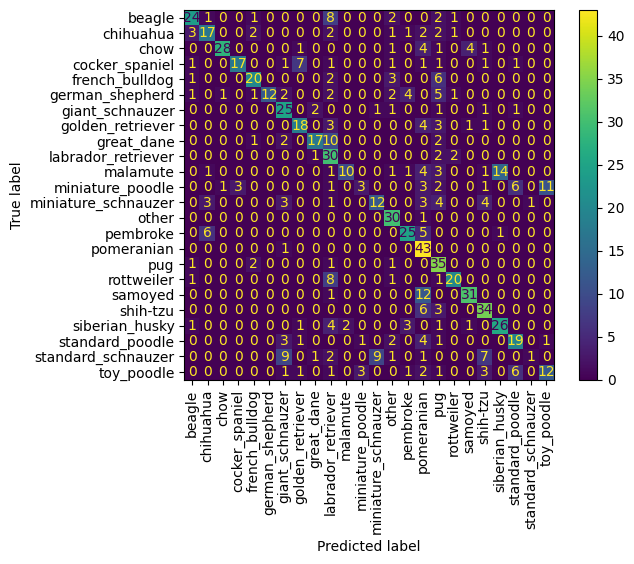

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix

cf_matrix = confusion_matrix(y_test, y_predict)
disp = ConfusionMatrixDisplay(cf_matrix, display_labels=classes)

fig, ax = plt.subplots()

disp.plot(ax=ax)

# Get the x-axis labels
x_labels = ax.get_xticklabels()

# Rotate the x-axis labels by 45 degrees
for label in x_labels:
    label.set_rotation(90)


Mô hình có sự nhầm lẫn nhất định với một số loài hao hao nhau

### ResNet 50

Sử dụng mô hình ResNet 50

Loại mô hình đã được huấn luyện với 50 nhãn trên tập ImageNet

ResNet 50 version 2 có trọng số sẵn được huấn luyện từ google

In [ ]:
import tensorflow_hub as hub
from keras.applications.resnet50 import ResNet50
def create_model_resnet50_v2(input_shape):
    resnet50=hub.KerasLayer('https://kaggle.com/models/google/resnet-v2/frameworks/TensorFlow2/variations/50-classification/versions/2')
    model = keras.models.Sequential([
        keras.layers.Input(shape=input_shape),
        resnet50,
        keras.layers.Dropout(0.5),
        keras.layers.Dense(24, activation='softmax')
    ])
    return model


In [ ]:
model = create_model_resnet50_v2((img_height, img_width, 3))
model.compile(loss='sparse_categorical_crossentropy',
                optimizer=keras.optimizers.Adam(),
                metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              25615849  
                                                                 
 dropout (Dropout)           (None, 1001)              0         
                                                                 
 dense (Dense)               (None, 24)                24048     
                                                                 
Total params: 25639897 (97.81 MB)
Trainable params: 24048 (93.94 KB)
Non-trainable params: 25615849 (97.72 MB)
_________________________________________________________________


In [27]:
folder='/content/drive/MyDrive/15_12/'
checkpoint=tf.keras.callbacks.ModelCheckpoint(
    filepath=folder+'ep{epoch:02d}_dogrdmodel_L2d0.5_resnetv2_24_acc_{accuracy:.2f}_val_acc_{val_accuracy:.2f}.h5',#cộng thêm tên file cấu trúc
    monitor='val_accuracy',
    save_best_only=True,
    mode='max'
)

In [ ]:
epoch=25
earlystopping = keras.callbacks.EarlyStopping(monitor ="val_loss",
                                        mode ="auto", patience = 5,
                                        restore_best_weights = True)
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=5, min_lr=0.0001)
history=model.fit(datagen.flow(X_train_process, y_train,batch_size=batch_size),
            epochs=epoch,steps_per_epoch=X_train_process.shape[0]//batch_size,verbose=1,
            validation_data=(X_val_process,y_val),
            callbacks=[reduce_lr,earlystopping,checkpoint])

Epoch 1/25
96/96 [==============================] - ETA: 0s - loss: 5.7118 - accuracy: 0.1374

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


96/96 [==============================] - 42s 331ms/step - loss: 5.7118 - accuracy: 0.1374 - val_loss: 1.7855 - val_accuracy: 0.4792 - lr: 0.0010
Epoch 2/25
96/96 [==============================] - 24s 250ms/step - loss: 3.8248 - accuracy: 0.2995 - val_loss: 1.4134 - val_accuracy: 0.5885 - lr: 0.0010
Epoch 3/25
96/96 [==============================] - 25s 259ms/step - loss: 3.1800 - accuracy: 0.3743 - val_loss: 1.3348 - val_accuracy: 0.6250 - lr: 0.0010
Epoch 4/25
96/96 [==============================] - 26s 272ms/step - loss: 2.9745 - accuracy: 0.3965 - val_loss: 1.1404 - val_accuracy: 0.6719 - lr: 0.0010
Epoch 5/25
96/96 [==============================] - 21s 214ms/step - loss: 2.7059 - accuracy: 0.4486 - val_loss: 1.1227 - val_accuracy: 0.6510 - lr: 0.0010
Epoch 6/25
96/96 [==============================] - 22s 228ms/step - loss: 2.5319 - accuracy: 0.4785 - val_loss: 1.1078 - val_accuracy: 0.6667 - lr: 0.0010
Epoch 7/25
96/96 [==============================] - 24s 246ms/step - loss: 

In [ ]:
epoch=25
earlystopping = keras.callbacks.EarlyStopping(monitor ="val_loss",
                                        mode ="auto", patience = 5,
                                        restore_best_weights = True)
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=5, min_lr=0.0001)
history2=model.fit(datagen.flow(X_train_process, y_train,batch_size=batch_size),
            epochs=epoch,steps_per_epoch=X_train_process.shape[0]//batch_size,verbose=1,
            validation_data=(X_val_process,y_val),
            callbacks=[reduce_lr,earlystopping,checkpoint])

Epoch 1/25
96/96 [==============================] - 25s 260ms/step - loss: 2.2870 - accuracy: 0.4844 - val_loss: 1.0607 - val_accuracy: 0.7031 - lr: 2.0000e-04
Epoch 2/25
96/96 [==============================] - 20s 212ms/step - loss: 2.2741 - accuracy: 0.4961 - val_loss: 1.0472 - val_accuracy: 0.6953 - lr: 2.0000e-04
Epoch 3/25
96/96 [==============================] - ETA: 0s - loss: 2.1213 - accuracy: 0.5117

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


96/96 [==============================] - 26s 275ms/step - loss: 2.1213 - accuracy: 0.5117 - val_loss: 1.0475 - val_accuracy: 0.7135 - lr: 2.0000e-04
Epoch 4/25
96/96 [==============================] - 20s 211ms/step - loss: 2.1161 - accuracy: 0.4941 - val_loss: 1.0576 - val_accuracy: 0.6927 - lr: 2.0000e-04
Epoch 5/25
96/96 [==============================] - 22s 223ms/step - loss: 2.1222 - accuracy: 0.5163 - val_loss: 1.0470 - val_accuracy: 0.7109 - lr: 2.0000e-04
Epoch 6/25
96/96 [==============================] - 20s 210ms/step - loss: 2.1181 - accuracy: 0.5020 - val_loss: 1.0644 - val_accuracy: 0.7005 - lr: 2.0000e-04
Epoch 7/25
96/96 [==============================] - 22s 226ms/step - loss: 2.0261 - accuracy: 0.5202 - val_loss: 1.0895 - val_accuracy: 0.7005 - lr: 2.0000e-04
Epoch 8/25
96/96 [==============================] - 20s 209ms/step - loss: 2.0350 - accuracy: 0.5208 - val_loss: 1.0664 - val_accuracy: 0.7031 - lr: 2.0000e-04
Epoch 9/25
96/96 [==============================] -

Load cả lịch sử của 2 lần huấn luyện để đánh giá

In [ ]:
model_history = pd.concat([pd.DataFrame(history.history),pd.DataFrame(history2.history)],axis=0)
model_history=model_history.reset_index()
model_history

,index,loss,accuracy,val_loss,val_accuracy,lr
0,0,5.711793,0.137370,1.785515,0.479167,0.0010
1,1,3.824827,0.299479,1.413442,0.588542,0.0010
2,2,3.180030,0.374349,1.334800,0.625000,0.0010
3,3,2.974493,0.396484,1.140418,0.671875,0.0010
4,4,2.705934,0.448568,1.122660,0.651042,0.0010
5,5,2.531878,0.478516,1.107795,0.666667,0.0010
6,6,2.456130,0.474609,1.133351,0.695312,0.0010
7,7,2.343827,0.483073,1.114691,0.708333,0.0010
8,8,2.380786,0.488932,1.115333,0.695312,0.0010
9,9,2.296608,0.492188,1.149903,0.695312,0.0010


<Axes: >

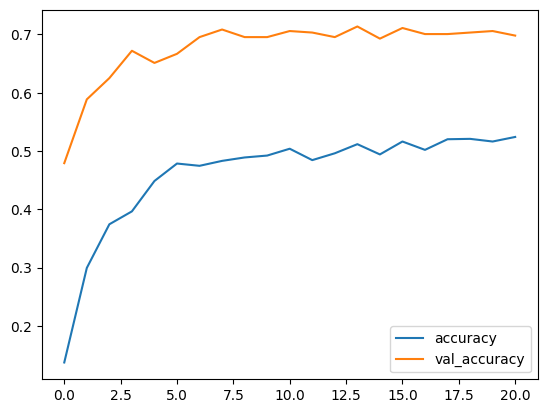

In [ ]:
model_history.loc[:,['accuracy','val_accuracy']].plot()

Mô hình có sự chênh lệch khá đồng đều, tập validation có accuracy lớn hơn tập train vì lúc này có áp dụng kĩ thuật sinh thêm dữ liệu nên tập train không cố định, ảnh biến dạng, tập validation lại nhỏ dẫn đến sự chênh lệch trong những lần train. Tuy nhiên phương pháp trên cộng thêm lớp dropout lại giúp mô hình khái quát khá tốt với đa dạng đặc trưng hình ảnh. 

Thử huấn luyện thêm với tập train cố định và nhiều lần đánh giá nhầm lẫn giữa các mô hình tốt để có được mô hình tốt.

In [20]:
import tensorflow_hub as hub
model=keras.models.load_model('/content/drive/MyDrive/15_12/ep01_dogrdmodel_L2d0.5_resnetv2_24_acc_0.71_val_acc_0.85.h5',custom_objects={'KerasLayer':hub.KerasLayer})
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              25615849  
                                                                 
 dropout (Dropout)           (None, 1001)              0         
                                                                 
 dense (Dense)               (None, 24)                24048     
                                                                 
Total params: 25639897 (97.81 MB)
Trainable params: 24048 (93.94 KB)
Non-trainable params: 25615849 (97.72 MB)
_________________________________________________________________


In [21]:
model.evaluate(X_test_process,y_test)

27/27 [==============================] - 8s 128ms/step - loss: 0.8551 - accuracy: 0.7677


[0.8550708889961243, 0.7676646709442139]

In [22]:
y_pred=np.argmax(model.predict(X_test_process),axis=1)
y_pred.shape

27/27 [==============================] - 3s 84ms/step


(835,)

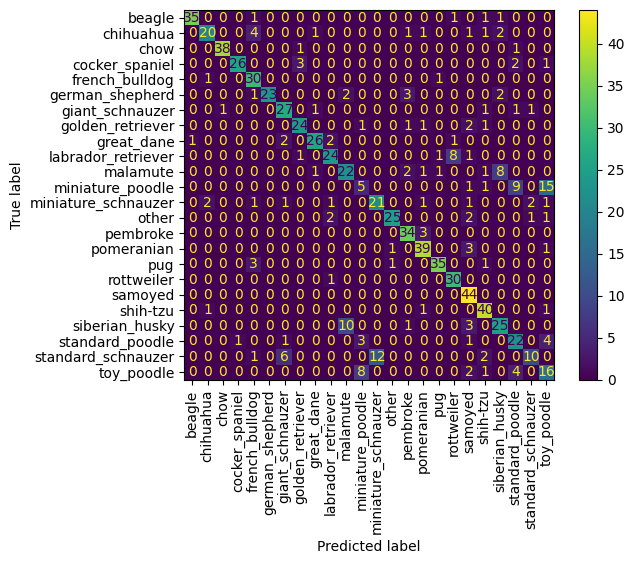

In [25]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix

cf_matrix = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(cf_matrix, display_labels=classes)

fig, ax = plt.subplots()

disp.plot(ax=ax)

# Get the x-axis labels
x_labels = ax.get_xticklabels()

# Rotate the x-axis labels by 45 degrees
for label in x_labels:
    label.set_rotation(90)


In [32]:
epoch=25
earlystopping = keras.callbacks.EarlyStopping(monitor ="val_loss",
                                        mode ="auto", patience = 5,
                                        restore_best_weights = True)
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=5, min_lr=0.0001)
history2=model.fit(X_train_process, y_train,batch_size=batch_size,
            epochs=epoch,
            validation_data=(X_val_process,y_val),
            callbacks=[reduce_lr,earlystopping,checkpoint])

Epoch 1/25
96/96 [==============================] - ETA: 0s - loss: 1.1379 - accuracy: 0.6979

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


96/96 [==============================] - 15s 76ms/step - loss: 1.1379 - accuracy: 0.6979 - val_loss: 0.6088 - val_accuracy: 0.8073 - lr: 2.0000e-04
Epoch 2/25
96/96 [==============================] - 6s 60ms/step - loss: 1.0754 - accuracy: 0.7174 - val_loss: 0.6108 - val_accuracy: 0.8021 - lr: 2.0000e-04
Epoch 3/25
96/96 [==============================] - 6s 63ms/step - loss: 0.9777 - accuracy: 0.7259 - val_loss: 0.6167 - val_accuracy: 0.7969 - lr: 2.0000e-04
Epoch 4/25
96/96 [==============================] - 7s 68ms/step - loss: 0.9738 - accuracy: 0.7389 - val_loss: 0.6142 - val_accuracy: 0.8125 - lr: 2.0000e-04
Epoch 5/25
96/96 [==============================] - 6s 62ms/step - loss: 0.9050 - accuracy: 0.7357 - val_loss: 0.6202 - val_accuracy: 0.8047 - lr: 2.0000e-04
Epoch 6/25
96/96 [==============================] - 6s 64ms/step - loss: 0.8024 - accuracy: 0.7643 - val_loss: 0.6182 - val_accuracy: 0.7995 - lr: 2.0000e-04


<Axes: >

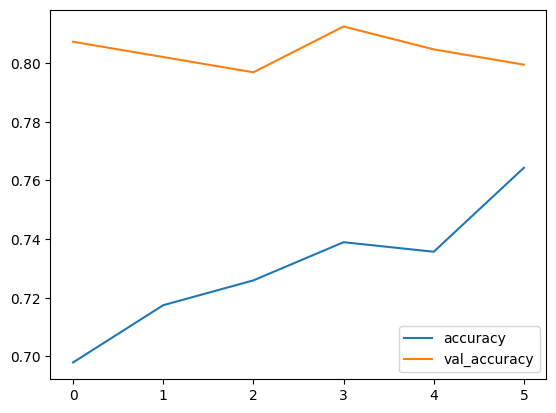

In [34]:
model_history = pd.DataFrame(history2.history)
model_history.loc[:,['accuracy','val_accuracy']].plot()

Hình thành được mô hình có khả năng phân loại 76% hiệu quả với giống chó ảnh không màu